<h1 style="text-align: center;">New York Airbnb Analysis</h1>

# Table of content
1. [Introduction](#Introduction:--The-Rise-of-Airbnb-in-New-York’s-Sharing-Economy)
2. [Analysis](#Analysis)
   - [Exploring the Dataset](#Exploring-the-Dataset)
   - [Data Cleaning](#Data-Cleaning)
3. [Guiding Questions Evolution](#Guiding-Questions-Evolution)
   - [Initial Guiding Questions](#Initial-Guiding-Questions)
   - [Evolved Guiding Questions](#Evolved-Guiding-Questions)
4. [Conclusion](#Conclusion)
5. [Feedback](#Feedback)
6. [Future Scope](#Future-Scope)
7. [References](#References)

#  Introduction

In an era of rapid globalization, the sharing economy has emerged as a transformative force, revolutionizing how we utilize resources and access services. At the forefront of this economic shift stands Airbnb, a platform that has redefined the travel industry by making accommodations more accessible and affordable for millions of globetrotters. 

As a top ten global destination, New York has seen its tourist numbers nearly triple since 1991, with half of that growth occurring in just the last decade. This explosive growth in tourism, coupled with the disruptive influence of Airbnb, presents a unique opportunity to analyze the dynamics of the short-term rental market in a major metropolitan area. 

This analysis of the Airbnb open dataset for New York aims to shed light on a few questions, seeking to provide valuable insights for multiple stakeholders: 

- Travelers can make more informed decisions about where to stay in the state and what room types to go for. 

- Hosts can understand the average reviews distribution across neighborhood groups with respect to the room type they provide.  

This data-driven approach will reveal the best neighborhoods for different types of stays, uncover pricing trends, and will try highlighting the factors that contribute to a successful Airbnb listing in one of the world's most competitive markets. 

 

In [7]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.impute import SimpleImputer
import plotly.express as px

# Analysis

## Exploring the Dataset

### a) Loading the dataset from Airbnb_Open_Data.csv file 

- Load the dataset from a `Airbnb_Open_Data.csv` file into a pandas DataFrame variable named **dataset** using the read_csv() function, enabling seamless data manipulation and analysis.
- Using the **head()** function, inspect a small sample of the dataset, displaying the first few rows along with all column names. 

In [10]:
dataset = pd.read_csv('Airbnb_Open_Data.csv')
#allows the display of all columns in a dataframe without truncation
pd.set_option('display.max_columns',None) 
dataset.head(3)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,US,False,strict,Private room,2020.0,$966,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,US,False,moderate,Entire home/apt,2007.0,$142,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,US,True,flexible,Private room,2005.0,$620,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN


### b) Dataset Overview Using .info() Function

The output of the **.info()** function provides a comprehensive summary of the dataset's structure. Here's a detailed explanation:

1. **Data Type**: The dataset is stored as a pandas.core.frame.DataFrame.
Size: The DataFrame contains a total of 102,599 entries, indexed from 0 to 102,598.
2. **Columns**: There are 26 columns in the dataset, each listed with its column name, the count of non-null values, and the data type of the values in that column.
3. **Non-Null Count**: The count of non-null values in each column indicates the presence of missing data. For example, the "NAME" column has 102,349 non-null values, meaning some entries are missing in the remaining 250 rows.
4. **Data Types**: There are three main data types in this dataset:
    - **int64** for integer values (e.g., "id" and "host id").
    - **float64** for numerical values that are floating-point numbers (e.g., "lat" and "price").
    - **object** for text or categorical data (e.g., "NAME" and "host name").
5. **Memory Usage**: The dataset occupies approximately 20.4 MB of memory.
   

| **Variable**                | **Description**                                                                 |
|-----------------------------|---------------------------------------------------------------------------------|
| `id`                        | Unique identifier for each listing                                              |
| `NAME`                      | Name of the Airbnb listing                                                      |
| `host id`                   | Unique identifier for the host                                                  |
| `host_identity_verified`     | Whether the host's identity is verified                                         |
| `host name`                 | Name of the host                                                                |
| `neighbourhood group`       | Larger area or district (e.g., Brooklyn, Manhattan)                             |
| `neighbourhood`             | Specific neighborhood where the listing is located                              |
| `lat`                       | Latitude of the listing                                                         |
| `long`                      | Longitude of the listing                                                        |
| `country`                   | Country where the listing is located                                            |
| `country code`              | Country code for the location                                                   |
| `instant_bookable`          | Indicates whether the listing is available for instant booking                  |
| `cancellation_policy`       | Cancellation policy applied to the listing                                      |
| `room type`                 | Type of room being listed (e.g., entire home, private room)                     |
| `Construction year`         | Year the property was built                                                     |
| `price`                     | Rental price per night                                                          |
| `service fee`               | Service fee associated with the listing                                         |
| `minimum nights`            | Minimum number of nights required for booking                                   |
| `number of reviews`         | Total number of reviews the listing has received                                |
| `last review`               | Date of the last review                                                         |
| `reviews per month`         | Number of reviews received per month                                            |
| `review rate number`        | Review rating score of the listing                                              |
| `calculated host listings count` | Number of listings the host has                                            |
| `availability 365`          | Number of days the listing is available per year                                |
| `house_rules`               | Rules set by the host for the listing                                           |
| `license`                   | License number or details for the property                                      |


In [13]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

### c) Dataset Overview Using .describe() Function

- The **.describe()** function provides a statistical summary of the numerical columns in the dataset. Here's a brief explanation of the output:

    1. **count**: The number of non-null entries for each column.
    2. **mean**: The average value of each column.
    3. **std**: The standard deviation, showing how spread out the values are.
    4. **min**: The minimum value in each column.
    5. **25%, 50%, 75%**: These are the 1st quartile (25%), median (50%), and 3rd quartile (75%), showing the distribution of values.
    6. **max**: The maximum value in each column.

In [15]:
dataset.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


### d) Visualizing Missing Data with a Heatmap
A heatmap is a powerful visualization tool used to represent the presence of missing data in a dataset. By applying a heatmap, we can easily identify where missing values are concentrated, allowing us to see patterns of missingness across columns and rows. The heatmap highlights missing values by marking them in a distinct color, making it visually intuitive. So, from the haetmap i got this results :

- Columns with few missing values, such as **NAME**, **host_identity_verified**, and **price**, have only small portions highlighted, indicating that these columns are mostly complete.
- Columns with a large amount of missing data, such as **house_rules** and **license**, have large, continuous blocks highlighted, clearly showing that these columns contain significant amounts of missing data.
- Columns like **last review** and **reviews per month**, with a high number of missing values, is showing significant sections highlighted, which signals a need for attention during data cleaning.

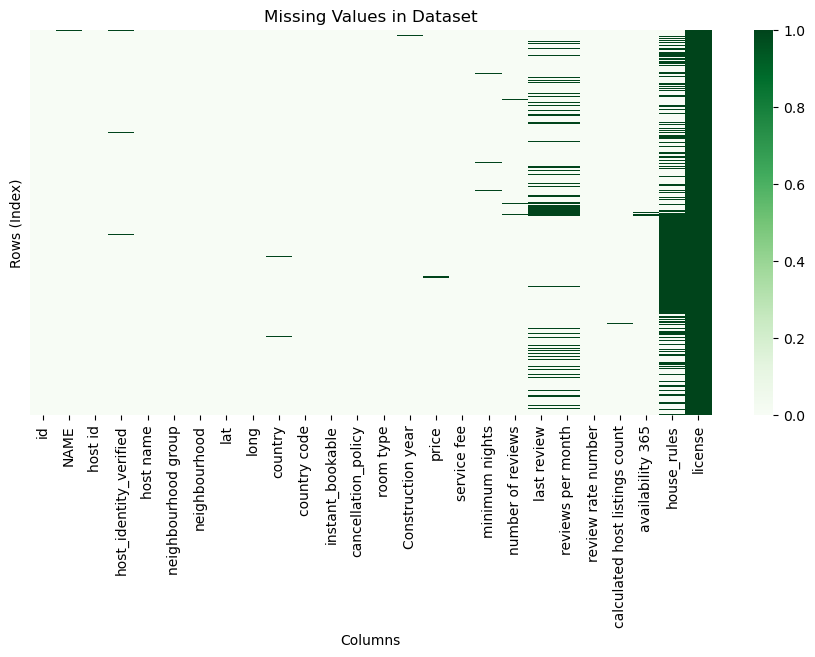

In [17]:
plt.figure(figsize=(11, 5))

# Generate heatmap for missing values, showing columns on x-axis and row indices on y-axis
sns.heatmap(dataset.isna(), cmap='Greens', cbar=True, xticklabels=True, yticklabels=False)

# Add titles and labels
plt.title('Missing Values in Dataset')
plt.xlabel('Columns')
plt.ylabel('Rows (Index)')
plt.show()

### e) Detecting and Summarizing Missing Values Using .isna() and .sum() Functions

By applying the **.isna()** function, we detected missing values across all columns in the dataset. The subsequent use of the **.sum()** function provided a count of missing values for each column. The results indicate that some columns have substantial missing data, while others are mostly complete:
  - Columns like id, host id, and room type have no missing values.
  - Several columns, such as NAME, host_identity_verified, and price, have a small proportion of missing values, ranging from 100 to 500 missing entries.
  - Some columns, like last review (15,893 missing values) and reviews per month (15,879 missing values), have a large number of missing values.
  - The license column has almost no data, with 102,597 missing entries out of 102,599.
  - Additionally, the house_rules column has over half its values missing (52,131 missing values).

Identifying these missing values is crucial for determining how to handle them in the data cleaning process, whether through imputation, deletion, or other techniques. As we saw with heatmap along with .isna() function.

In [19]:
print(dataset.isna().sum())

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

### f) Correlation Heatmap

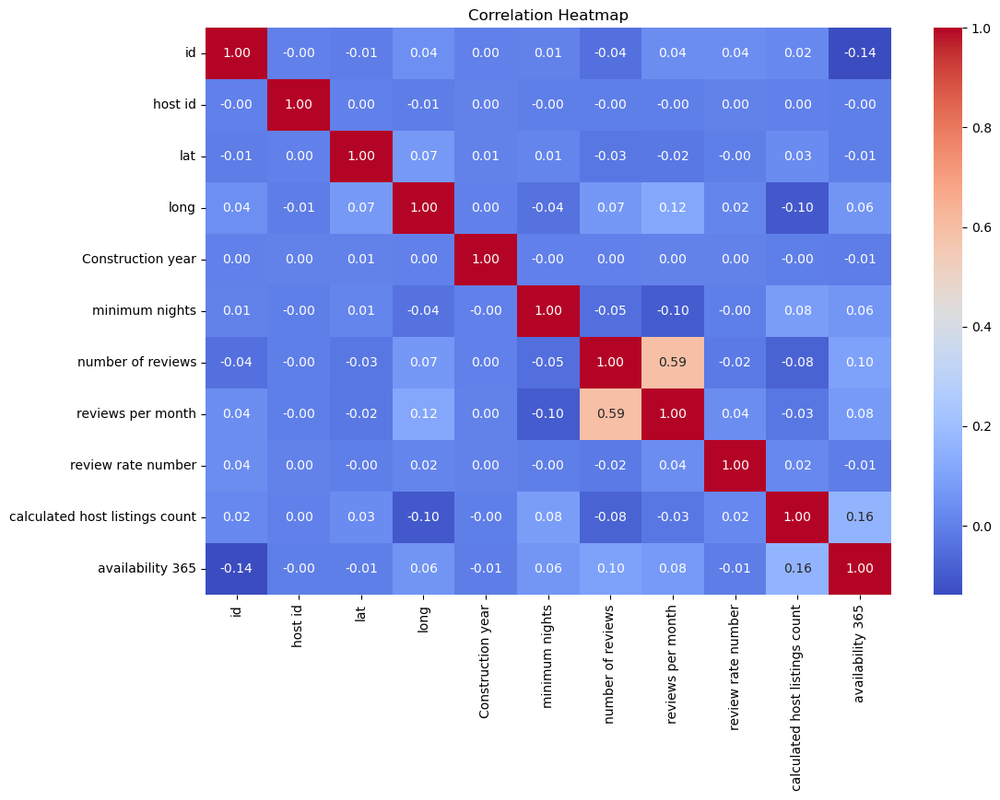

In [21]:
plt.figure(figsize=(12, 8))
correlation_matrix = dataset.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

**Key Observations:**

1. Diagonal Values: These are all 1 because a variable is perfectly correlated with itself.
2. Lat (latitude) & Long (longitude): Very low correlations with other features except for a small correlation between lat and long (0.07).
3. Price & Service Fee: A high positive correlation (~1.00), indicating that price and service fee tend to increase together.
4. Availability 365 & Calculated Host Listings Count: There is a moderate positive correlation (0.17), implying that hosts with more listings tend to have more available days.
5. Price & Other Features: Very weak or no correlation with most other features like "number of reviews," "review rate number," and "minimum nights."
6. Construction Year: Low correlations with most features, suggesting that the year a property was built doesn't strongly impact the other variables.
7. Instant Bookable: Negligible correlations with most other features.

Overall, this heatmap is useful to identify which features are related to each other. High correlations (closer to 1 or -1) could be useful for feature selection or further analysis, while weak correlations suggest no significant relationship between the variables.

## Data Cleaning



### a) Dropping Irrelevant and High-Missing-Value ColumnsDropping columns containing most missing value 

In addition to removing columns with excessive missing values, we also eliminate columns that are deemed irrelevant to the analysis. This step is crucial for refining the dataset, as it ensures that we focus on variables that provide meaningful insights. The following columns are dropped:

- **id**: Primarily serves as an index and does not contribute analytical value.
- **host id**: Similar to the id column, it may not provide relevant insights for our analysis.
- **NAME**: This column is not utilized in any analysis, making it unnecessary to retain.
- **license**: Contains almost entirely missing data (102,597 missing values), rendering it unusable.
- **house_rules**: With 52,131 missing values, this column lacks sufficient data to be informative.
- **reviews per month**: High missingness (15,879 entries) indicates limited usefulness.
- **last review**: Also has a high number of missing values (15,893), suggesting it may not be reliable.
- **host name**: This column does not contribute significant insights to our analysis and is therefore considered irrelevant.
- **country code** and **country**: Since we are specifically analyzing data from New York, these columns are redundant and do not provide any additional value to the dataset.

By removing both irrelevant columns and those with high missingness, we streamline the dataset, enhancing its quality and ensuring that subsequent analyses are based on the most pertinent information. This process is essential for building a more robust and effective data analysis framework.

After removing irrelevant columns and those with excessive missing values, we are left with a refined dataset containing 102,599 entries and 16 columns.

In [25]:
unwanted_columns = ['id', 'host id','NAME','license','house_rules','reviews per month','last review','host name','country code','country']
dataset.drop(unwanted_columns, axis = 1, inplace = True)

In [26]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 16 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   host_identity_verified          102310 non-null  object 
 1   neighbourhood group             102570 non-null  object 
 2   neighbourhood                   102583 non-null  object 
 3   lat                             102591 non-null  float64
 4   long                            102591 non-null  float64
 5   instant_bookable                102494 non-null  object 
 6   cancellation_policy             102523 non-null  object 
 7   room type                       102599 non-null  object 
 8   Construction year               102385 non-null  float64
 9   price                           102352 non-null  object 
 10  service fee                     102326 non-null  object 
 11  minimum nights                  102190 non-null  float64
 12  number of review

### b) Renaming Columns for Clarity and Consistency

To enhance the clarity and consistency of the dataset, we have renamed several columns using the **rename()** function in pandas. This step is essential for improving the readability of the DataFrame and ensuring that column names are more intuitive for analysis. The following changes have been made:

- **host_identity_verified** has been renamed to **host identity**: This change makes the column name more user-friendly, separating the words for better readability.
- **Construction year** has been renamed to **construction year**: Standardizing the capitalization of this column improves consistency across the dataset.
- **instant_bookable** has been renamed to **instant bookable**: Similar to the first change, this adjustment enhances readability by separating the words.
- ***cancellation_policy** has been renamed to **cancellation policy**: This renaming follows the same logic, making the column name clearer.
  
By applying these changes, we ensure that the column names are descriptive and easier to understand, which aids in the data analysis process. The use of inplace=True allows these modifications to be made directly to the original DataFrame without the need to create a new copy.

In [28]:
dataset.rename(columns={'host_identity_verified':'host identity','Construction year':'construction year', 'instant_bookable':'instant bookable','cancellation_policy':'cancellation policy'},inplace=True)
dataset.head()

,host identity,neighbourhood group,neighbourhood,lat,long,instant bookable,cancellation policy,room type,construction year,price,service fee,minimum nights,number of reviews,review rate number,calculated host listings count,availability 365
0,unconfirmed,Brooklyn,Kensington,40.64749,-73.97237,False,strict,Private room,2020.0,$966,$193,10.0,9.0,4.0,6.0,286.0
1,verified,Manhattan,Midtown,40.75362,-73.98377,False,moderate,Entire home/apt,2007.0,$142,$28,30.0,45.0,4.0,2.0,228.0
2,NaN,Manhattan,Harlem,40.80902,-73.94190,True,flexible,Private room,2005.0,$620,$124,3.0,0.0,5.0,1.0,352.0
3,unconfirmed,Brooklyn,Clinton Hill,40.68514,-73.95976,True,moderate,Entire home/apt,2005.0,$368,$74,30.0,270.0,4.0,1.0,322.0
4,verified,Manhattan,East Harlem,40.79851,-73.94399,False,moderate,Entire home/apt,2009.0,$204,$41,10.0,9.0,3.0,1.0,289.0


### c) Converting the columns to the appropriate data type

In [30]:
# convert 5 columns to categories
cat_cols = ['host identity', 'neighbourhood group', 'neighbourhood', 'cancellation policy', 'room type']
num_cols = ['lat', 'long', 'construction year', 'minimum nights', 'number of reviews', 'review rate number', 'calculated host listings count', 'availability 365']
for x in cat_cols:
    dataset[x] = dataset[x].astype('category')

# convert instant bookable to bool type
dataset['instant bookable']=dataset['instant bookable'].astype('bool')

# converting prive and service fee to str before cleaning after cleaning will convert to float
dataset['price'] = dataset['price'].astype(str)
dataset['service fee'] = dataset['service fee'].astype(str)


### d) Cleaning price and service fee column and converting it to float type

In [32]:
dataset['price'] = dataset['price'].str.replace('$', '', regex=False).str.replace(',', '', regex=False).astype(float)
dataset['service fee'] = dataset['service fee'].str.replace('$', '', regex=False).str.replace(',', '', regex=False).astype(float)


In [33]:
dataset[['price', 'service fee']].head()

,price,service fee
0,966.0,193.0
1,142.0,28.0
2,620.0,124.0
3,368.0,74.0
4,204.0,41.0


### e) Droping missing values of the numerical column except price and service fee column

In [35]:
dataset = dataset.dropna(subset=num_cols)

### f) Filling the missing values in price and service fees with median

In [37]:
dataset['price'] = dataset['price'].fillna(dataset['price'].median())
dataset['service fee'] = dataset['service fee'].fillna(dataset['service fee'].median())

### g) Dropping all the categorical column having missing values

In [39]:
dataset = dataset.dropna(subset=cat_cols)

In [40]:
## Counting all the missing values
dataset.isna().sum()

host identity                     0
neighbourhood group               0
neighbourhood                     0
lat                               0
long                              0
instant bookable                  0
cancellation policy               0
room type                         0
construction year                 0
price                             0
service fee                       0
minimum nights                    0
number of reviews                 0
review rate number                0
calculated host listings count    0
availability 365                  0
dtype: int64


### h) Identifying and Handling Outliers in the Dataset

To ensure the integrity and quality of our analysis, we employed a statistical summary of the dataset in above section combined with boxplots to identify outliers effectively. Outliers can significantly skew results and interpretations, making their detection and handling a critical step in data preparation.

We began by visually examining boxplots, which provided insights into the distribution of the data and highlighted potential outliers. These outliers were then systematically removed using manual thresholding based on our domain knowledge and the context of the dataset.

In **Availability 365** column, The minimum value is negative, which is illogical in the context of this variable. This column should represent the number of days a property is available for booking throughout the year, meaning it should range from 0 to 365 days. A negative value suggests either data entry errors or misinterpretation of the data

In **Minimum Nights** column, Similarly, the minimum value for the minimum nights column is significantly low, suggesting values below the realistic expectations for minimum stay requirements. Additionally, the maximum value in this column is exceedingly high, indicating that there are listings requiring an unrealistic number of nights for a booking.

While considering alternative methods for outlier detection, we explored two common techniques: the Z-Score method and the Interquartile Range (IQR) method. However, both methods presented challenges that rendered them impractical for our specific dataset.

- **Z-Score Method**: This method measures how many standard deviations an element is from the mean. However, it was deemed unsuitable due to the skewed distribution of key variables, such as minimum_nights and availability_365. In skewed distributions, the mean and standard deviation can be heavily influenced by outliers, leading to unreliable Z-scores.
- **IQR Method**: The IQR method identifies outliers based on the interquartile range, which is the range between the first (Q1) and third (Q3) quartiles. While effective in many scenarios, this method flagged an excessive number of outliers—approximately one-fifth of the dataset—making it impractical for our analysis.
- Given these challenges, we opted for **domain-specific filtering** to establish realistic thresholds for identifying outliers. For example, we set a practical limit for minimum nights and availability 365, allowing only values between **1 and 365**. This approach ensured that we maintained the integrity of our dataset while effectively managing outliers.

In [42]:
dataset.describe()

,lat,long,construction year,price,service fee,minimum nights,number of reviews,review rate number,calculated host listings count,availability 365
count,100568.000000,100568.000000,100568.000000,100568.000000,100568.000000,100568.000000,100568.000000,100568.000000,100568.000000,100568.000000
mean,40.728052,-73.949616,2012.487899,625.449755,125.061342,8.103254,27.263116,3.280000,7.968917,140.847526
std,0.055849,0.049580,5.762105,331.338504,66.249966,28.624500,49.030088,1.284039,32.299378,135.415290
min,40.499790,-74.249840,2003.000000,50.000000,10.000000,-1223.000000,0.000000,1.000000,1.000000,-10.000000
25%,40.688740,-73.982580,2008.000000,341.000000,68.000000,2.000000,1.000000,2.000000,1.000000,3.000000
50%,40.722270,-73.954440,2012.000000,625.000000,125.000000,3.000000,7.000000,3.000000,1.000000,96.000000
75%,40.762750,-73.932288,2017.000000,912.000000,182.000000,5.000000,30.000000,4.000000,2.000000,268.000000
max,40.916970,-73.705220,2022.000000,1200.000000,240.000000,5645.000000,1024.000000,5.000000,332.000000,3677.000000


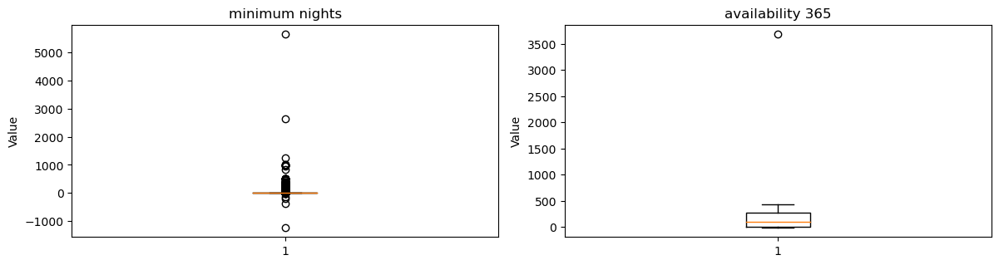

In [43]:
# Create boxplots for specific columns
plt.figure(figsize=(12, 6))

columns_to_plot = ['minimum nights', 'availability 365']

for i, column in enumerate(columns_to_plot, start=1):
    plt.subplot(2, 2, i)  # Create a 2x2 grid for the subplots
    plt.boxplot(dataset[column])  
    plt.title(column)
    plt.ylabel('Value')

plt.tight_layout()
plt.show()

In [44]:
filtered_dataset = dataset[(dataset['minimum nights'] >= 0) & (dataset['minimum nights'] <= 365) & (dataset['availability 365']>= 0) & (dataset['availability 365'] <= 365)]


In [45]:
print(filtered_dataset['availability 365'].min())
print(filtered_dataset['availability 365'].max())
print(filtered_dataset['minimum nights'].min())
print(filtered_dataset['minimum nights'].max())

0.0
365.0
1.0
365.0


In [46]:
#again checking if any null values remaining 
filtered_dataset.isnull().sum()

host identity                     0
neighbourhood group               0
neighbourhood                     0
lat                               0
long                              0
instant bookable                  0
cancellation policy               0
room type                         0
construction year                 0
price                             0
service fee                       0
minimum nights                    0
number of reviews                 0
review rate number                0
calculated host listings count    0
availability 365                  0
dtype: int64

### i) Removing Duplicates from the Dataset
In our data cleaning process, it was essential to identify and remove any duplicate entries to ensure the integrity of our analysis. Duplicates can arise from various sources, including data collection errors, merging datasets, or incorrect data entry. Having duplicate records can skew results and lead to misleading conclusions.
In our code we used :

- **filtered_dataset.duplicated()**: This method returns a boolean Series indicating whether each row is a duplicate of a previous row. A value of True indicates a duplicate, while False indicates a unique entry.
- **.sum()**: This function aggregates the boolean Series, counting the number of True values, which represents the total number of duplicate rows in the dataset.

In our analysis, we found that there were **3,533** duplicate values in the dataset prior to cleaning.

After identifying the number of duplicates, we can proceed with removing these entries to refine our dataset. We used **.drop_duplicates(inplace=True)**, this command will remove all duplicate rows from **filtered_dataset**, ensuring that each entry is unique and ready for subsequent analysis. Then after removing we are left with 0 duplicates.

In [48]:
print("Number of duplicate values before cleaning:", filtered_dataset.duplicated().sum())

Number of duplicate values before cleaning: 3533


In [49]:
filtered_dataset.drop_duplicates(inplace=True)
print("Number of duplicate values after cleaning:", filtered_dataset.duplicated().sum())

Number of duplicate values after cleaning: 0


### j) Standardizing Neighborhood Group Names

In the data cleaning process, it is essential to ensure consistency in categorical variables, such as neighborhood group names. In our dataset, we identified some inconsistencies in the naming of the neighbourhood group values. Specifically, the neighborhood group **'brookln'** was incorrectly labeled and should be standardized to **'Brooklyn'**. Additionally, **'manhatan'** was a misspelling of **'Manhattan'**.

Unique Neighborhood Groups Before Cleaning

Before we applied any standardization, our dataset contained the following unique neighborhood groups:

- Brooklyn
- Manhattan
- brookln
- manhatan
- Queens
- Bronx
- Staten Island
  
This inconsistency can lead to confusion during analysis, as different spellings or capitalizations of the same category will be treated as separate entities.

Unique Neighborhood Groups After Cleaning

After performing this standardization, the unique neighborhood groups in our dataset are now:

- Brooklyn
- Manhattan
- Queens
- Bronx
- Staten Island

By cleaning and standardizing the neighborhood group names, we enhance the overall quality and reliability of our dataset, paving the way for more accurate insights and analyses.

After Cleaning we are left with 93886 rows and 16 columns.

In [51]:
filtered_dataset['neighbourhood group'].unique().tolist()

['Brooklyn',
 'Manhattan',
 'brookln',
 'manhatan',
 'Queens',
 'Bronx',
 'Staten Island']

In [52]:
filtered_dataset['neighbourhood group'].replace({'manhatan':'Manhattan','brookln':'Brooklyn'},inplace=True)

In [53]:
filtered_dataset['neighbourhood group'].unique().tolist()

['Brooklyn', 'Manhattan', 'Queens', 'Bronx', 'Staten Island']

In [54]:
filtered_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 93886 entries, 0 to 102057
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   host identity                   93886 non-null  category
 1   neighbourhood group             93886 non-null  category
 2   neighbourhood                   93886 non-null  category
 3   lat                             93886 non-null  float64 
 4   long                            93886 non-null  float64 
 5   instant bookable                93886 non-null  bool    
 6   cancellation policy             93886 non-null  category
 7   room type                       93886 non-null  category
 8   construction year               93886 non-null  float64 
 9   price                           93886 non-null  float64 
 10  service fee                     93886 non-null  float64 
 11  minimum nights                  93886 non-null  float64 
 12  number of reviews     

# Guiding Questions Evolution


At the outset of the project, we defined several guiding questions aimed at understanding the key factors influencing Airbnb listings, pricing, and guest reviews. However, as we worked with the dataset, some of these questions evolved based on both the insights we uncovered and feedback from peers and supervisors. Below, we outline the original questions and explain how they changed during the course of the project. 

 

## Initial Guiding Questions 

1. Examine the distribution of Airbnb listings across NYC neighborhoods, focusing on patterns in areas with strong activity. 

    - Our goal was to analyze the density of listings in different neighborhoods and understand the areas with high Airbnb activity. 

2. Are property prices influenced by the neighborhood or the year the property was built? 

   - We aimed to determine whether prices were primarily driven by location or the age of the property. 

3. How does availability affect pricing in different areas? 

    - This question sought to explore the relationship between listing availability and pricing across neighborhoods, particularly in high-demand areas. 

 

## Evolved Guiding Questions

As we began analyzing the dataset, our focus shifted in several key areas. Some of the initial questions were either too broad or not as insightful as expected, which led to a more refined and targeted approach. Here’s how the questions evolved: 


### Guiding Question 1: Neighborhood Distribution of Listings

- **Question:** How are Airbnb listings distributed across NYC neighborhoods? 
- **Approach:** We used bar plots to visualize the distribution of listings by neighbourhood_group. 
- **Key Findings:** Manhattan had the highest concentration of listings, followed by Brooklyn. Staten Island had the fewest listings, with a higher average price due to limited supply (listed in the further questions)

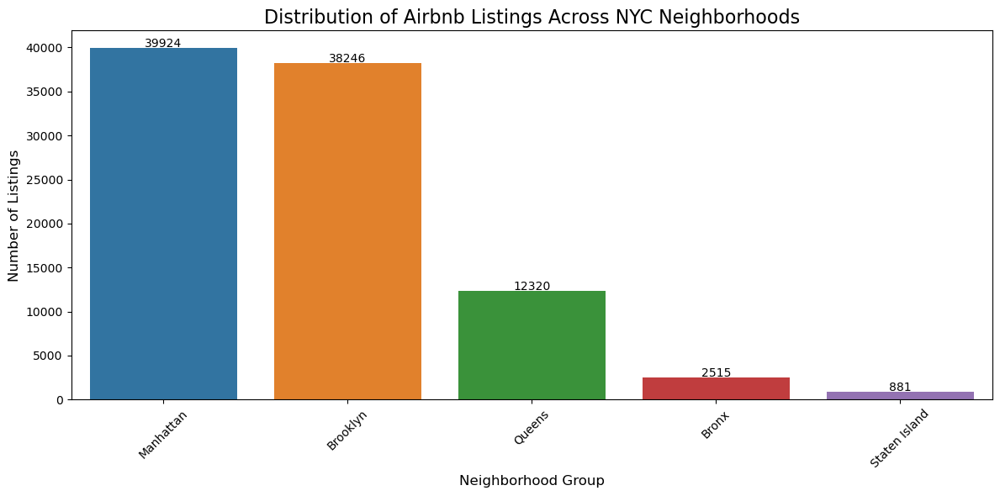

In [58]:
# Create a bar plot
plt.figure(figsize=(12, 6))
sns.countplot(x='neighbourhood group', data=filtered_dataset, order=filtered_dataset['neighbourhood group'].value_counts().index)

# Customize the plot
plt.title('Distribution of Airbnb Listings Across NYC Neighborhoods', fontsize=16)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.ylabel('Number of Listings', fontsize=12)
plt.xticks(rotation=45)

# Add value labels on top of each bar
for i, v in enumerate(filtered_dataset['neighbourhood group'].value_counts()):
    plt.text(i, v + 100, str(v), ha='center', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

#### Scatter plot to show neighborhood groups and neighborhood

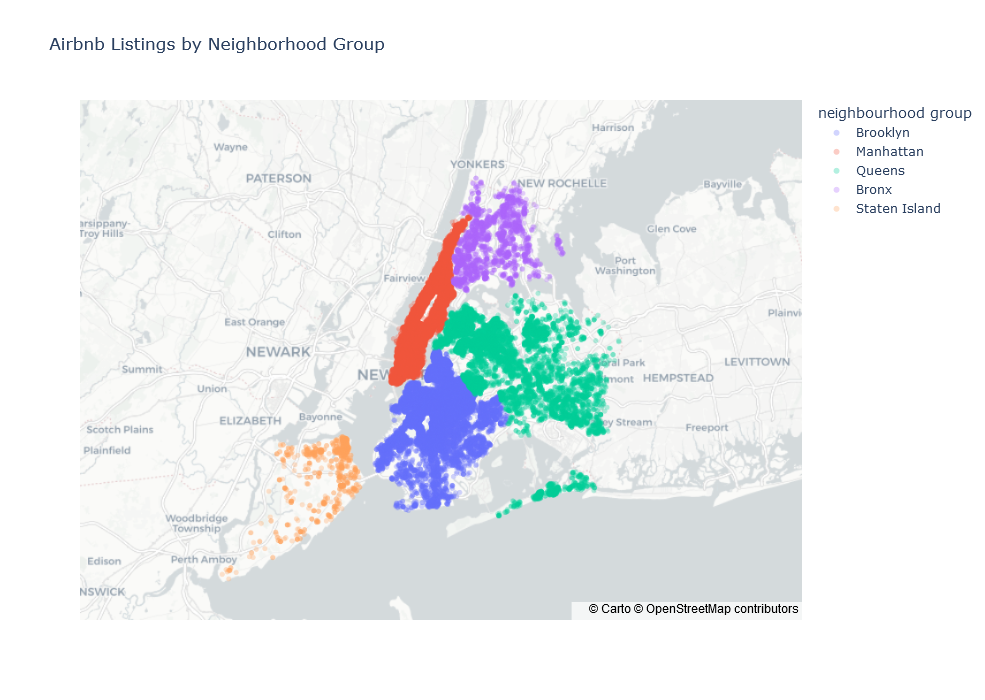

In [60]:
fig = px.scatter_mapbox(
    filtered_dataset, 
    lat='lat', 
    lon='long', 
    color='neighbourhood group',  # Color code by neighborhood group
    hover_name='neighbourhood',  # Show neighborhood name on hover
    mapbox_style="carto-positron",  # Use OpenStreetMap for background
    zoom=9,  # Adjust zoom level for better visibility
    opacity=0.3,
    title='Airbnb Listings by Neighborhood Group'
)
fig.update_layout(
    width=1000,  # Set figure width
    height=700   # Set figure height
)
# Show the plot
fig.show()

#### Top 10 Neighborhood with most listing

In [62]:
neighborhood_host_counts = filtered_dataset['neighbourhood'].value_counts().head(10)
neighborhood_host_counts

neighbourhood
Bedford-Stuyvesant    7295
Williamsburg          7051
Harlem                4934
Bushwick              4577
Hell's Kitchen        3676
Upper West Side       3508
Upper East Side       3318
East Village          3158
Midtown               3136
Crown Heights         2976
Name: count, dtype: int64

#### Top 10 most expensive neighbourhoods

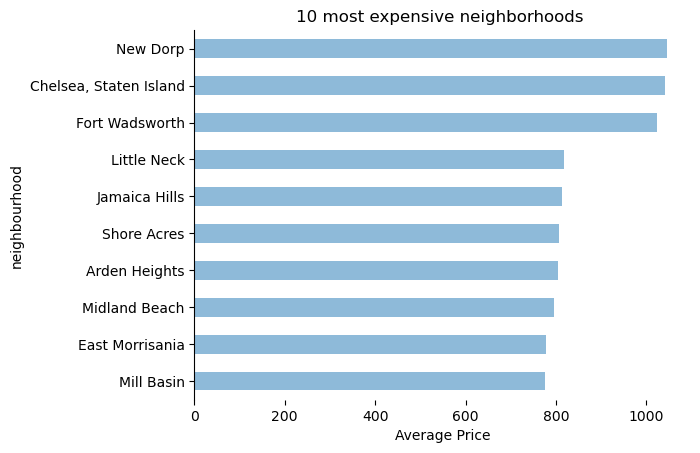

In [64]:
filtered_dataset.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)[-10:].plot(kind='barh',alpha=0.5)
plt.gca().spines[['top', 'right','bottom']].set_visible(False)
plt.xlabel('Average Price')
plt.title('10 most expensive neighborhoods ');

#### Bottom 10 least expensive neighbourhoods

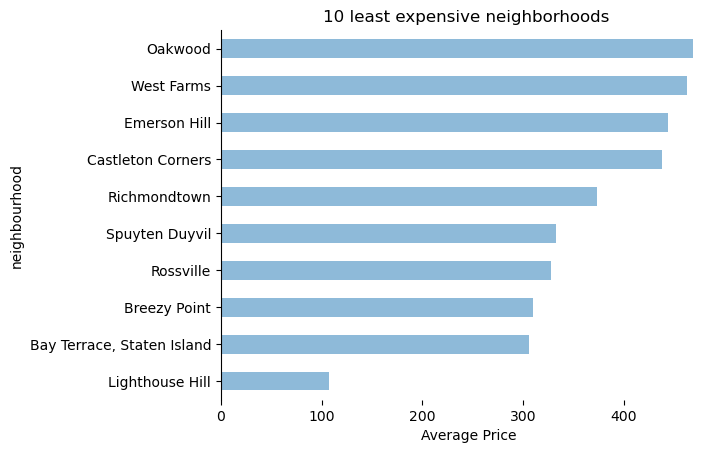

In [66]:

filtered_dataset.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)[:10].plot(kind='barh',alpha=0.5)
plt.gca().spines[['top', 'right','bottom']].set_visible(False)
plt.xlabel('Average Price')
plt.title('10 least expensive neighborhoods ');

#### Observations:
The most expensive neighbourhood is New Dorp and the least expensive neighbourhood is Lighthouse Hill. Interesting to note that both are in the Staten Island neighbourhood group which makes up less than 1% of our dataset.


### Guiding Question 2: Impact of room types and neighborhood groups on Average Listing Price

- **Question:** Are property prices influenced by neighborhood or room type? 
- **Approach:** We used bar plots to explore the relationship between price, room_type, and neighbourhood_group. 
- **Key Findings:** Entire homes/apartments generally had higher prices than shared or private rooms, with Manhattan commanding the highest prices overall. Staten Island showed higher prices for shared rooms, likely due to a different type of demand (e.g., proximity to nature and residential experiences). 


#### Room types, Neighborhoods, and Average Listing Price

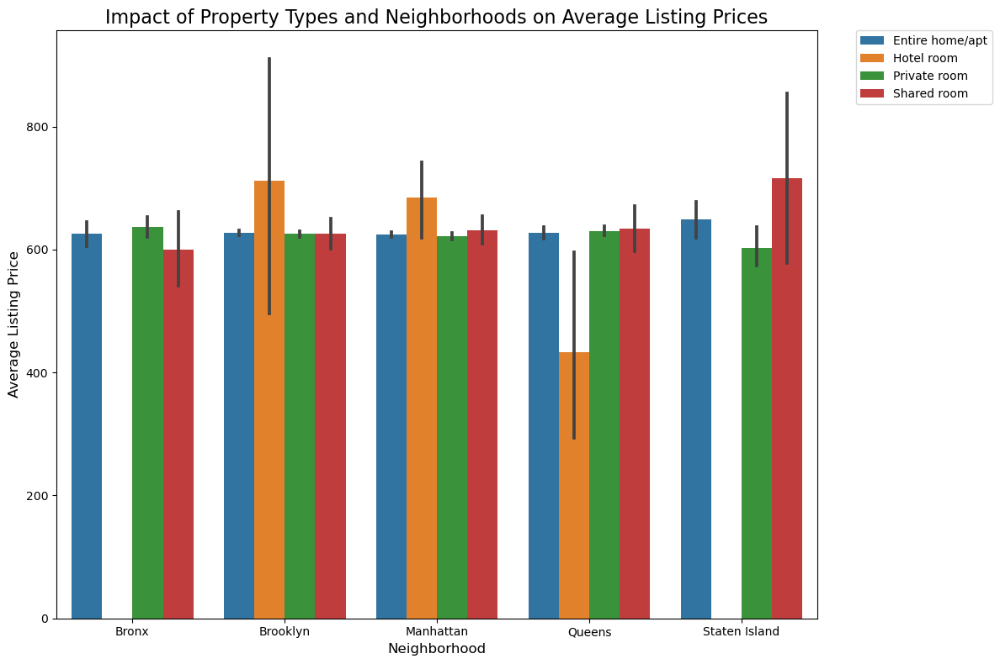

In [70]:
plt.figure(figsize=(12, 8))

# Create the visualization: Barplot with hue to show both neighborhood and property type
sns.barplot(data=filtered_dataset, x='neighbourhood group', y='price', hue='room type',)

# Customize the plot
plt.title('Impact of Property Types and Neighborhoods on Average Listing Prices', fontsize=16)
plt.xlabel('Neighborhood', fontsize=12)
plt.ylabel('Average Listing Price', fontsize=12)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.gca().grid(axis='x', visible=False)
plt.legend(title='Property Type', fontsize=10, title_fontsize=12,loc='upper right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
# Show the plot
plt.tight_layout()
plt.show()

#### Observations:
1. Booking shared rooms is the most expensive in Staten Island.
2. Hotel rooms are the most expensive in Brooklyn and least expensive in Queens.
3. Private room and apartment prices don't vary significantly between neighborhoods.

### Guiding Question 3: Impact of room types and neighborhood groups on Rating

- **Question:** How do guest reviews correlate with property prices and the neighborhood groups? 
- **Approach:** We plotted bar plots to analyze the relationship between review_rate_number, neighbourhood groups and room type. 
- **Key Findings:** Listings with higher review ratings tended to have slightly higher prices, but the correlation was not very strong. This suggests that other factors, such as location and room type, play a more significant role in determining price. 

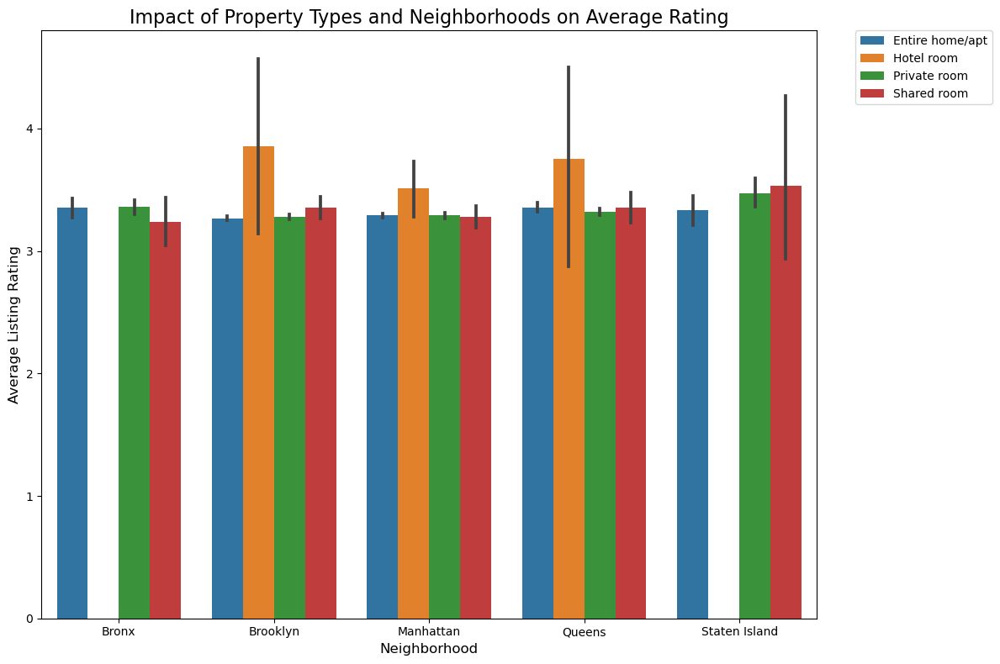

In [73]:
plt.figure(figsize=(12, 8))

# Create the visualization: Barplot with hue to show both neighborhood and property type
sns.barplot(data=filtered_dataset, x='neighbourhood group', y='review rate number', hue='room type',)

# Customize the plot
plt.title('Impact of Property Types and Neighborhoods on Average Rating', fontsize=16)
plt.xlabel('Neighborhood', fontsize=12)
plt.ylabel('Average Listing Rating', fontsize=12)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.gca().grid(axis='x', visible=False)
plt.legend(title='Property Type', fontsize=10, title_fontsize=12,loc='upper right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
# Show the plot
plt.tight_layout()
plt.show()

#### Observations:
1. Hotel rooms in Queens and Brooklyn both have high average ratings. Though the average price for a hotel room in Queens is much less than that of Brooklyn.
2. Average ratings for other room types are quite similar across neighborhood groups.
3. Staten Islands' shared rooms although expensive still high have a high rating.

### Guiding question 4: The supply and demand dynamics in New York 

**Question:** How does rental density correlate with property prices across different neighborhood groups?

**Approach:** We plotted a scatter plot comparing the average price of rentals against the density of rentals (rentals per square kilometer) for each neighborhood group. The area used to compute the density of each neighbourhood group was obtained from Wikipedia. A trend line was added to observe the overall relationship.

**Key Findings:** An inverse relationship was observed between rental density and price, where higher-density areas tended to have lower prices. 

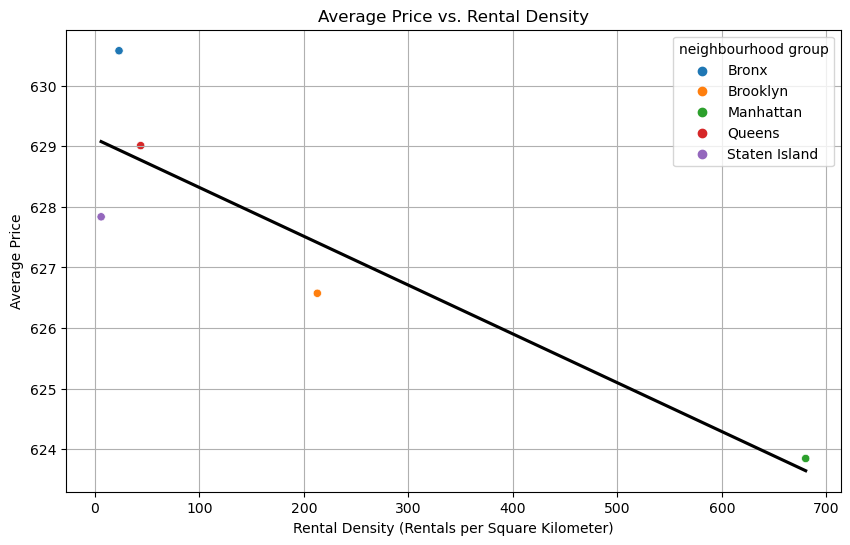

In [77]:
# Group by neighborhood and calculate average price and rental count
grouped = filtered_dataset.groupby('neighbourhood group').agg(
    avg_price=('price', 'mean'),
    rental_count=('price', 'size')
).reset_index()

area_sizes = {
    'neighbourhood group': ['Bronx', 'Brooklyn', 'Manhattan','Queens','Staten Island'],
    'area_size(sq.km)': [109.2,179.7,58.7,281.6,149.0]  # area sizes in square km obtain from Wikipedia
}
area_df = pd.DataFrame(area_sizes)

# Merge area sizes with the grouped data
grouped = pd.merge(grouped, area_df, on='neighbourhood group', how='left')

# Calculate rental density (rentals per square kilometer)
grouped['density'] = grouped['rental_count'] / grouped['area_size(sq.km)']


#Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='density', y='avg_price', hue='neighbourhood group', data=grouped)
#sactter plot with regression line
sns.regplot(x='density', y='avg_price', data=grouped, scatter=False, color='black', ci=None)


# Add title and labels
plt.title('Average Price vs. Rental Density')
plt.xlabel('Rental Density (Rentals per Square Kilometer)')
plt.ylabel('Average Price')


plt.grid(True)
plt.savefig('avg_price_vs_density.png', format='png', dpi=300)
# Display the plot
plt.show()


#### Observations:

The graph reveals that while there is a general negative relationship between rental density and average price, some neighborhoods (like Staten Island). We see here that though Staten Island has the lowest rental density, it ranks third when it comes to average price. This could indicate a niche market in that area.
Surprisingly, Manhattan's average price is relatively close to the rest of the neighbourhood groups despite its huge difference in rental density.
Location desirability plays a significant role in rental pricing, and future analysis might explore other neighborhood-specific factors (such as proximity to tourist attractions) to understand these pricing dynamics better.

# Conclusion

There were a few key takeaways based on our guiding questions.  

- Manhattan is the most densely populated with AirBnB listings while New Dorp, a Staten island neighborhood, ranks as the most expensive. 

- When it comes to room types, hotel rooms and shared rooms were the most expensive room types. 

- Hotel rooms costed the most in Brooklyn and Manhattan, while shared rooms were more expensive in Staten Island. Private rooms and Entire houses/apartments were almost the same across different neighbourhoods. 

- According to the Business Insider article, New Yorks’ recent Local Law 18, centers around limiting short-term rentals. This might be the reason for higher hotel rates, stemming from an imbalance in demand and supply forces. 

- Our correlation matrix gave us a correlation of –0.01 between Review ratings and AirBnB prices. The correlation was extremely weak hence we concluded that prices were not being influenced by review ratings as they were by categorical variables such as room types and neighbourhoods. 

- Hotel rooms in Queens and Brooklyn had the highest ratings, even though hotel rooms in Queens were the cheapest. Shared rooms in Staten still managed to get high ratings as well, despite being more expensive. 

# Future Scope

The following improvements outline potential directions for further analysis, with the goal of delivering more actionable insights for hosts, guests, and market stakeholders:
- Temporal data integration: Airbnb prices fluctuate based on seasons, holidays, and events. A future analysis could integrate temporal data to assess how pricing changes over time. This could involve analyzing price trends across different months, seasons, or during local events.
- Proximity to Popular Landmarks: Merging geospatial data to include proximity to specific tourist attractions (museums, landmarks, beaches) could offer insights into how location drives pricing and occupancy rates.
- Develop a recommendation system that suggests optimal pricing for new hosts or suggests listings to users based on their preferences (e.g., amenities, location, and reviews).
- Analysis on how local regulations, such as short-term rental laws, affect Airbnb listings' performance (price, occupancy rates). This is especially relevant in cities with strict regulations around short-term rentals.

# References

1. A. Azmoudeh, “Airbnb Open Data,” Kaggle, https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata (accessed Sep. 22, 2024). 
2. E. Relman, “NYC shuttered 80% of its Airbnbs in an attempt to make housing more affordable. all that’s done so far is make hotels more expensive.,” Business Insider, https://www.businessinsider.com/airbnb-numbers-shrink-hotel-prices-soar-ban-nyc-2024-6 (accessed Oct. 15, 2024).
3. Jessica Jones-Gorman, “Staten Island home prices continue to rise amid tightening inventory levels, report says,” silive, https://www.silive.com/news/2024/09/staten-island-home-prices-continue-to-rise-amid-tightening-inventory-levels-report-says.html (accessed Oct. 15, 2024). 
4. “Boroughs of New York City,” Wikipedia, https://en.wikipedia.org/wiki/Boroughs_of_New_York_City (accessed Oct. 17, 2024). 